In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
sns.set_style("darkgrid")
plt.rcParams['font.size'] = 14
plt.rcParams['figure.figsize'] = (10, 6)

In [3]:
raw_df = pd.read_csv("../Logistic Regression/weatherAUS.csv")

In [4]:
raw_df.isna().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [5]:
raw_df.dropna(subset=["RainToday", "RainTomorrow"], inplace=True)

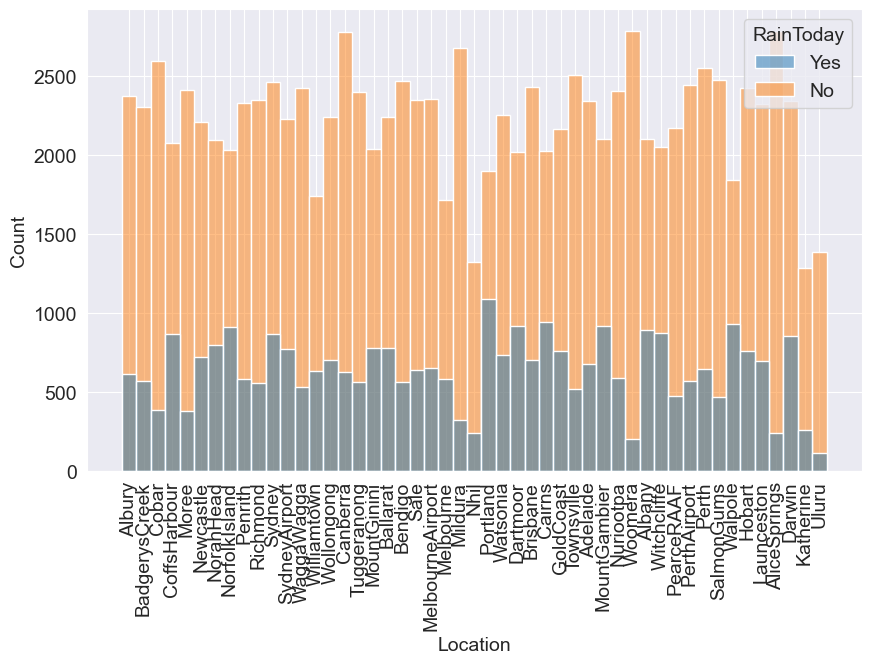

In [6]:
sns.histplot(raw_df, x="Location", hue="RainToday", hue_order=["Yes","No"])
plt.xticks(raw_df.Location.unique(), rotation=90);

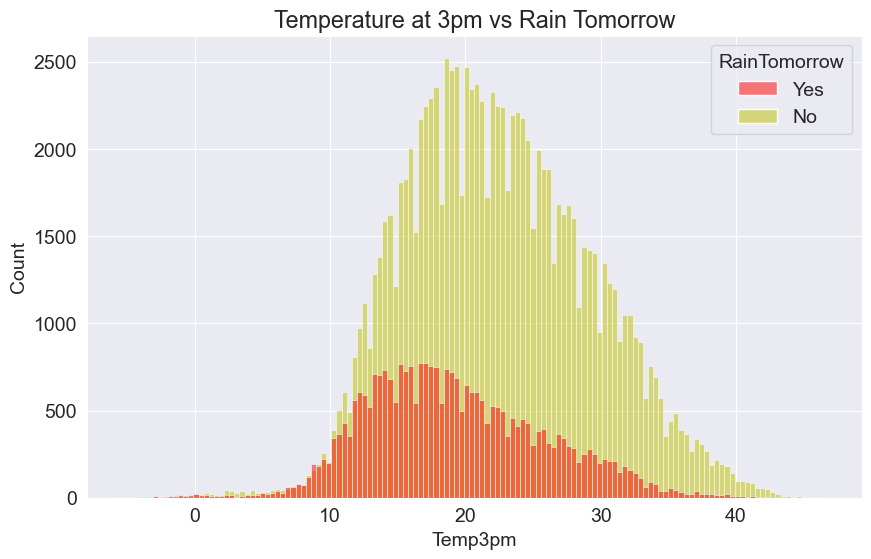

In [7]:
sns.histplot(raw_df, x="Temp3pm", hue="RainTomorrow", hue_order=["Yes", "No"], fill=True, palette={"Yes": "red", "No": "y"})
plt.title("Temperature at 3pm vs Rain Tomorrow")
plt.show()

In [8]:
import plotly.express as px

In [9]:
px.histogram(raw_df[raw_df["RainTomorrow"]=="No"], x="Temp3pm", color="RainTomorrow", title="Temperature at 3pm vs Rain Tomorrow")

In [10]:
raw_df[raw_df["Temp3pm"]==18.6]["Temp3pm"].count()

798

In [11]:
raw_df["Temp3pm"].value_counts()

20.0    862
19.0    852
18.4    847
18.5    846
17.8    841
       ... 
44.9      1
45.9      1
46.2      1
46.7      1
43.8      1
Name: Temp3pm, Length: 500, dtype: int64

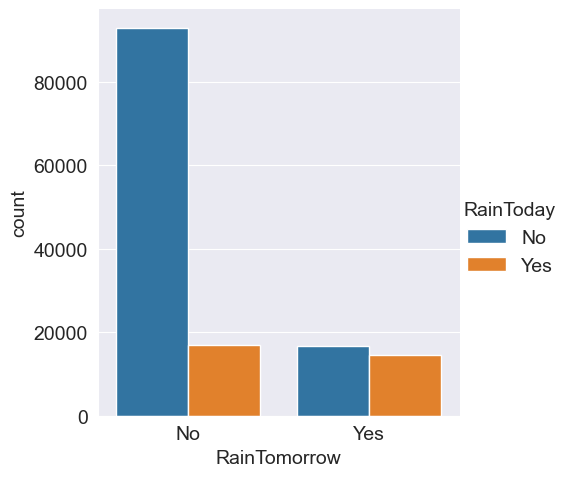

In [12]:
sns.catplot(raw_df, kind="count", hue="RainToday", x="RainTomorrow")

<Axes: xlabel='RainTomorrow', ylabel='Count'>

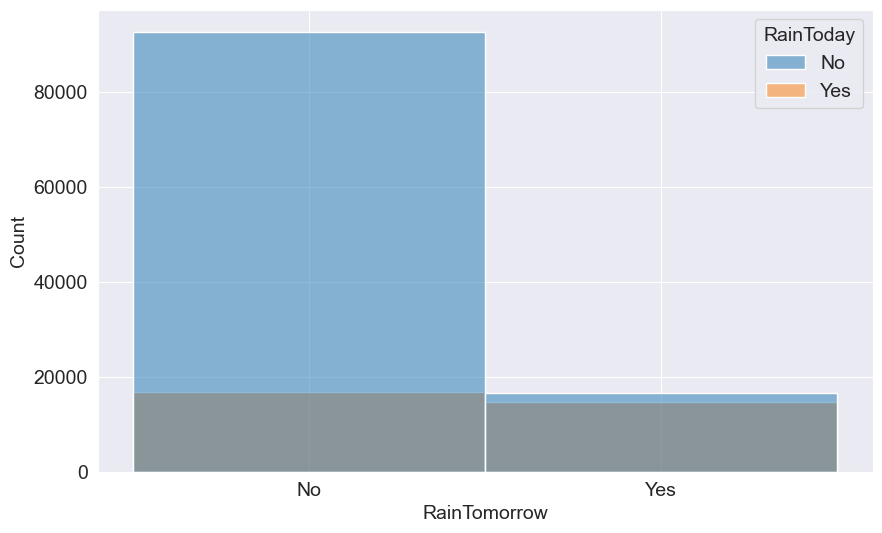

In [13]:
sns.histplot(raw_df, hue="RainToday", x="RainTomorrow")

In [14]:
raw_frac = raw_df.sample(frac=0.1).copy()
raw_frac

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
32934,2015-11-18,Sydney,17.4,36.5,0.0,11.0,13.0,SSW,57.0,W,...,45.0,17.0,1013.6,1009.7,5.0,1.0,25.1,35.6,No,No
132028,2014-09-27,Hobart,6.0,20.4,0.0,2.8,6.9,N,50.0,NNW,...,58.0,44.0,1016.4,1013.3,2.0,7.0,13.3,19.6,No,No
72991,2016-05-11,Mildura,9.1,18.7,0.2,4.3,7.9,WNW,41.0,WNW,...,76.0,53.0,1021.5,1018.7,7.0,6.0,12.9,17.8,No,No
76276,2012-08-19,Portland,5.2,12.4,0.8,0.6,0.6,W,37.0,NW,...,88.0,84.0,1023.1,1021.3,1.0,8.0,9.8,11.4,No,Yes
87222,2008-12-23,Cairns,24.1,32.3,10.8,7.6,4.8,NaN,NaN,SSE,...,79.0,60.0,1011.7,1008.8,7.0,6.0,26.9,30.0,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19365,2012-07-04,NorahHead,8.2,14.9,0.0,NaN,NaN,SSW,61.0,WSW,...,59.0,70.0,1023.9,1024.6,NaN,NaN,11.1,13.9,No,Yes
10976,2014-07-01,CoffsHarbour,2.4,18.8,0.0,NaN,NaN,NaN,NaN,NaN,...,48.0,34.0,NaN,NaN,NaN,NaN,12.5,18.4,No,No
9546,2010-05-04,CoffsHarbour,15.5,20.6,8.6,2.8,0.7,NNE,20.0,WNW,...,96.0,94.0,1022.8,1018.7,8.0,8.0,17.7,19.3,Yes,Yes
46213,2009-07-19,Canberra,-0.4,13.5,0.0,2.4,8.7,NNW,35.0,NNW,...,67.0,51.0,1022.9,1020.8,5.0,1.0,8.1,12.7,No,No


In [15]:
year = pd.DatetimeIndex(raw_df.Date).year
year.value_counts()

2016    17341
2014    17181
2015    17089
2009    16514
2010    16191
2013    15935
2011    14983
2012    14894
2017     8369
2008     2229
2007       61
Name: Date, dtype: int64

In [16]:
categorical_columns = raw_df.select_dtypes("object").columns[1:-1]
numerical_cols = raw_df.select_dtypes("number").columns
raw_df2 = raw_df.copy()
raw_df2[categorical_columns] = raw_df2[categorical_columns].fillna("Unknown")

In [17]:
raw_df2.shape, raw_df.shape

((140787, 23), (140787, 23))

In [18]:
train_df = raw_df2[year < 2015]
val_df = raw_df2[year == 2015]
test_df = raw_df2[year > 2015]

train_df.shape

(97988, 23)

In [19]:
input_cols = list(train_df.columns)[1:-1]
target_col = "RainTomorrow"
input_cols

['Location',
 'MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustDir',
 'WindGustSpeed',
 'WindDir9am',
 'WindDir3pm',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'RainToday']

In [20]:
train_inputs = train_df[input_cols].copy()
val_inputs = val_df[input_cols].copy()
test_inputs = test_df[input_cols].copy()

In [21]:
train_target = train_df[target_col].copy()
val_target = val_df[target_col].copy()
test_target = test_df[target_col].copy()

In [22]:
numerical_cols = list(train_inputs.select_dtypes(np.number))
categorical_cols = list(train_inputs.select_dtypes(include="object"))

In [23]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [24]:
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    17
WindDir9am     17
WindDir3pm     17
RainToday       2
dtype: int64

In [25]:
train_inputs[numerical_cols].isna().sum()

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [26]:
from sklearn.impute import SimpleImputer

In [27]:
imputer = SimpleImputer(strategy="mean")
imputer.fit(raw_df2[numerical_cols])

SimpleImputer()

In [28]:
train_inputs[numerical_cols] = imputer.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = imputer.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = imputer.transform(test_inputs[numerical_cols])

In [29]:
from sklearn.preprocessing import MinMaxScaler

In [30]:
scaler = MinMaxScaler()
scaler.fit(train_inputs[numerical_cols])

MinMaxScaler()

In [31]:
scaler.data_min_

array([ -8.5,  -4.1,   0. ,   0. ,   0. ,   6. ,   0. ,   0. ,   0. ,
         0. , 980.5, 979. ,   0. ,   0. ,  -5.9,  -5.1])

In [32]:
scaler.data_max_

array([  33.9,   48.1,  371. ,   82.4,   14.3,  135. ,   87. ,   87. ,
        100. ,  100. , 1041. , 1039.6,    9. ,    9. ,   40.2,   46.1])

In [33]:
train_inputs[numerical_cols] = scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols] = scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols] = scaler.transform(test_inputs[numerical_cols])

In [34]:
train_inputs[numerical_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.519590,0.006396,0.065020,0.532714,0.265107,0.161970,0.215668,0.686309,0.514693,0.612014,0.596437,0.483192,0.493693,0.493189,0.520333
std,0.149458,0.133673,0.022962,0.038060,0.203741,0.102420,0.102805,0.101424,0.189008,0.206376,0.111335,0.109954,0.255486,0.238028,0.138521,0.133024
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.377358,0.421456,0.000000,0.046117,0.524476,0.193798,0.080460,0.149425,0.570000,0.370000,0.543802,0.526403,0.333333,0.333333,0.392625,0.423828
50%,0.478774,0.507663,0.000000,0.066414,0.533604,0.255814,0.149425,0.218391,0.690000,0.520000,0.614125,0.598316,0.492351,0.499917,0.488069,0.509766
75%,0.591981,0.613027,0.002156,0.067961,0.643357,0.310078,0.218391,0.275862,0.830000,0.650000,0.682645,0.665017,0.666667,0.666667,0.590022,0.609375
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [35]:
train_df[categorical_cols].isna().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [36]:
train_df[categorical_cols].nunique()

Location       49
WindGustDir    17
WindDir9am     17
WindDir3pm     17
RainToday       2
dtype: int64

In [37]:
from sklearn.preprocessing import OneHotEncoder
enc = OneHotEncoder(sparse_output=False, handle_unknown="ignore")
enc.fit(raw_df2[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse_output=False)

In [38]:
encoded_cols = list(enc.get_feature_names_out())

In [39]:
enc.transform(train_inputs[categorical_cols]).shape

(97988, 102)

In [40]:
train_inputs[encoded_cols] = enc.transform(train_inputs[categorical_cols])

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\3922326411.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\3922326411.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\3922326411.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a

In [41]:
val_inputs[encoded_cols] = enc.transform(val_inputs[categorical_cols])

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\2288058205.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\2288058205.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\2288058205.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a

In [42]:
test_inputs[encoded_cols] = enc.transform(test_inputs[categorical_cols])

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\1270489618.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\1270489618.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\Ahmad Kazeem\AppData\Local\Temp\ipykernel_204\1270489618.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a

In [43]:
train_inputs.isna().sum()[train_inputs.isna().sum() != 0]

Series([], dtype: int64)

In [44]:
train_inputs.to_parquet("train_inputs.parquet")
val_inputs.to_parquet("val_inputs.parquet")
test_inputs.to_parquet("test_inputs.parquet")

In [45]:
train_inputs = pd.read_parquet("train_inputs.parquet")
val_inputs = pd.read_parquet("val_inputs.parquet")
test_inputs = pd.read_parquet("test_inputs.parquet")

In [46]:
input_cols = numerical_cols + encoded_cols


In [47]:
train_inputs[input_cols]

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,...,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,RainToday_No,RainToday_Yes
0,0.516509,0.517241,0.001617,0.066414,0.533604,0.294574,0.229885,0.275862,0.71,0.22,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,0.375000,0.559387,0.000000,0.066414,0.533604,0.294574,0.045977,0.252874,0.44,0.25,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,0.504717,0.570881,0.000000,0.066414,0.533604,0.310078,0.218391,0.298851,0.38,0.30,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
3,0.417453,0.614943,0.000000,0.066414,0.533604,0.139535,0.126437,0.103448,0.45,0.16,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.613208,0.697318,0.002695,0.066414,0.533604,0.271318,0.080460,0.229885,0.82,0.33,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,0.599057,0.714559,0.000000,0.066414,0.533604,0.286822,0.275862,0.298851,0.22,0.13,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
144549,0.556604,0.783525,0.000000,0.066414,0.533604,0.193798,0.218391,0.229885,0.16,0.08,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
144550,0.608491,0.802682,0.000000,0.066414,0.533604,0.255814,0.298851,0.103448,0.15,0.08,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
144551,0.674528,0.816092,0.000000,0.066414,0.533604,0.286822,0.321839,0.195402,0.22,0.09,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [48]:
from sklearn.linear_model import LogisticRegression as LgReg

In [49]:
model = LgReg(solver='liblinear', max_iter=300)

In [50]:
model.fit(train_inputs[input_cols], train_target)

LogisticRegression(max_iter=300, solver='liblinear')

In [51]:
weights_df = pd.DataFrame(dict(features=np.append(input_cols, 1), weights=np.append(model.coef_, model.intercept_)))

In [52]:
plt.rcParams['font.size'] = 11
plt.figure(figsize=(20, 20), dpi=500)
sns.barplot(weights_df.sort_values("weights", ascending=True), y='features', x='weights')


<Axes: xlabel='weights', ylabel='features'>

In [53]:
X_train = train_inputs[numerical_cols + encoded_cols]
X_val = val_inputs[numerical_cols + encoded_cols]
X_test = test_inputs[numerical_cols + encoded_cols]

In [54]:
X_prob = model.predict(X_train)

In [55]:
model.predict_proba(X_train)

array([[0.94423037, 0.05576963],
       [0.94063562, 0.05936438],
       [0.96114696, 0.03885304],
       ...,
       [0.98754895, 0.01245105],
       [0.98341033, 0.01658967],
       [0.87494352, 0.12505648]])

In [56]:
from sklearn.metrics import accuracy_score, confusion_matrix

In [57]:
accuracy_score(train_target, X_prob)

0.8520022859942034

In [58]:
model.classes_

array(['No', 'Yes'], dtype=object)

In [59]:
cf = confusion_matrix(train_target, X_prob, normalize="true")

<Axes: >

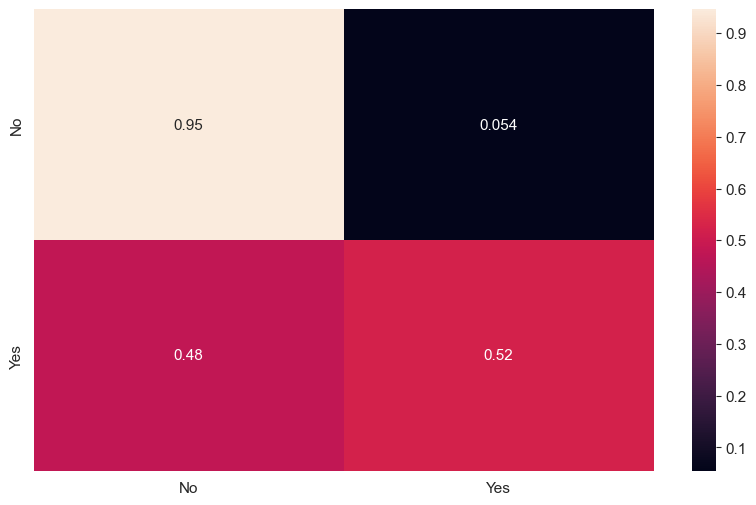

In [60]:
sns.heatmap(cf, annot=True, xticklabels=["No", "Yes" ], yticklabels=["No", "Yes" ])

In [61]:
def accuracy_test(inputs, target, name=''):
    preds = model.predict(inputs)
    accuracy = accuracy_score(target, preds)
    print(f"{accuracy:.2f}% score")
    
    cf = confusion_matrix(target, preds, normalize="true")  
    sns.heatmap(cf, annot=True, xticklabels=["No", "Yes" ], yticklabels=["No", "Yes" ]) 
    plt.title(f"Confusion Matrix for {name}")

0.85% score


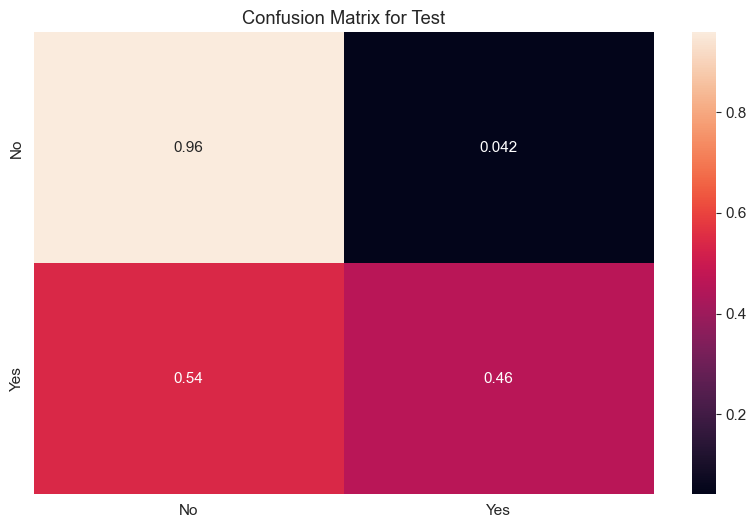

In [62]:
accuracy_test(X_val, val_target, name="Test")

0.84% score


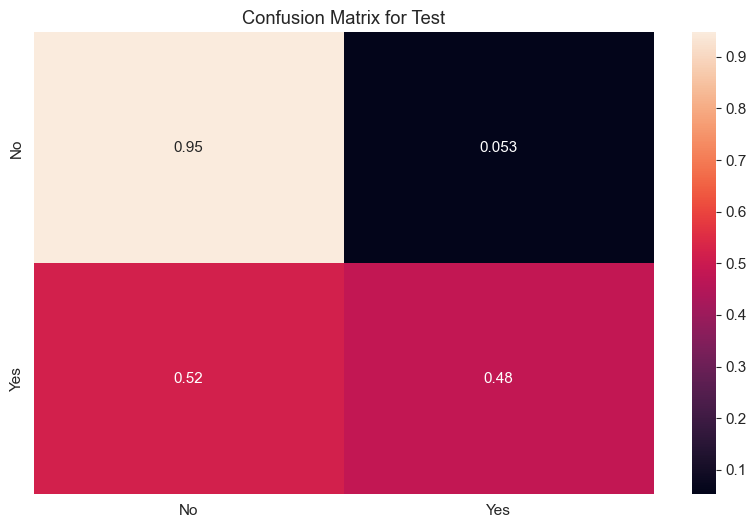

In [63]:
accuracy_test(X_test, test_target, name="Test")

In [64]:
from sklearn.tree import DecisionTreeClassifier

In [65]:
model = DecisionTreeClassifier(random_state=42)

In [66]:
model.fit(X_train, train_target)

DecisionTreeClassifier(random_state=42)

In [67]:
train_preds = model.predict(X_train)

In [68]:
accuracy_score(train_preds, train_target)

0.9999795893374699

In [69]:
model.score(X_val, val_target)

0.794955819533033

In [70]:
model.score(X_test, test_target)

0.7740956826137689

In [71]:
val_target.value_counts() / len(val_target)

No     0.790626
Yes    0.209374
Name: RainTomorrow, dtype: float64

In [72]:
from sklearn.tree import plot_tree, export_text

[Text(0.5, 0.9, 'Humidity3pm <= 0.715\ngini = 0.346\nsamples = 97988\nvalue = [76190, 21798]'),
 Text(0.25, 0.7, 'Humidity3pm <= 0.512\ngini = 0.244\nsamples = 81588\nvalue = [69975, 11613]'),
 Text(0.125, 0.5, 'Sunshine <= 0.533\ngini = 0.142\nsamples = 47657\nvalue = [43985, 3672]'),
 Text(0.0625, 0.3, 'Pressure3pm <= 0.567\ngini = 0.335\nsamples = 6010\nvalue = [4731, 1279]'),
 Text(0.03125, 0.1, '\n  (...)  \n'),
 Text(0.09375, 0.1, '\n  (...)  \n'),
 Text(0.1875, 0.3, 'WindGustSpeed <= 0.391\ngini = 0.108\nsamples = 41647\nvalue = [39254, 2393]'),
 Text(0.15625, 0.1, '\n  (...)  \n'),
 Text(0.21875, 0.1, '\n  (...)  \n'),
 Text(0.375, 0.5, 'WindGustSpeed <= 0.333\ngini = 0.359\nsamples = 33931\nvalue = [25990, 7941]'),
 Text(0.3125, 0.3, 'Rainfall <= 0.008\ngini = 0.304\nsamples = 27841\nvalue = [22637, 5204]'),
 Text(0.28125, 0.1, '\n  (...)  \n'),
 Text(0.34375, 0.1, '\n  (...)  \n'),
 Text(0.4375, 0.3, 'Pressure3pm <= 0.532\ngini = 0.495\nsamples = 6090\nvalue = [3353, 2737]'),

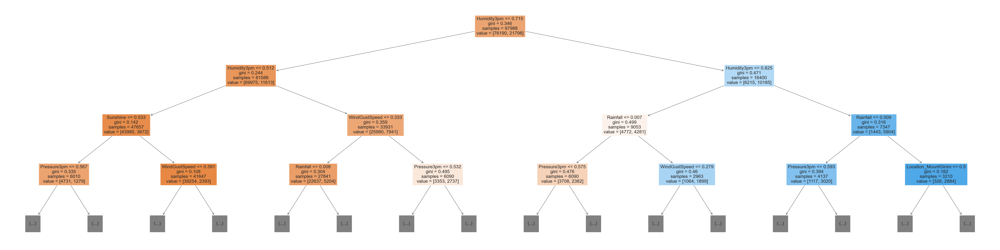

In [73]:
plt.figure(figsize=(80, 20))
plot_tree(model, feature_names=X_train.columns, max_depth=3, filled=True)

In [74]:
print(export_text(model, feature_names=X_train.columns.tolist(), max_depth=3))

|--- Humidity3pm <= 0.72
|   |--- Humidity3pm <= 0.51
|   |   |--- Sunshine <= 0.53
|   |   |   |--- Pressure3pm <= 0.57
|   |   |   |   |--- truncated branch of depth 24
|   |   |   |--- Pressure3pm >  0.57
|   |   |   |   |--- truncated branch of depth 26
|   |   |--- Sunshine >  0.53
|   |   |   |--- WindGustSpeed <= 0.39
|   |   |   |   |--- truncated branch of depth 36
|   |   |   |--- WindGustSpeed >  0.39
|   |   |   |   |--- truncated branch of depth 33
|   |--- Humidity3pm >  0.51
|   |   |--- WindGustSpeed <= 0.33
|   |   |   |--- Rainfall <= 0.01
|   |   |   |   |--- truncated branch of depth 46
|   |   |   |--- Rainfall >  0.01
|   |   |   |   |--- truncated branch of depth 32
|   |   |--- WindGustSpeed >  0.33
|   |   |   |--- Pressure3pm <= 0.53
|   |   |   |   |--- truncated branch of depth 30
|   |   |   |--- Pressure3pm >  0.53
|   |   |   |   |--- truncated branch of depth 26
|--- Humidity3pm >  0.72
|   |--- Humidity3pm <= 0.82
|   |   |--- Rainfall <= 0.01
|   |   |

In [75]:
importances_df = pd.DataFrame({
    'feature': X_train.columns, 
    'importance': model.feature_importances_
})

In [76]:
plt.rcParams['font.size'] = 11
plt.figure(figsize=(20, 20), dpi=500)
sns.barplot(importances_df, y="feature", x='importance')

<Axes: xlabel='importance', ylabel='feature'>

### Regularization

In [77]:
model.get_depth()

49

In [78]:
model = DecisionTreeClassifier(max_depth=13, random_state=42)
model.fit(X_train, train_target)

DecisionTreeClassifier(max_depth=13, random_state=42)

In [79]:
model.score(X_train, train_target)

0.8979058660244111

In [80]:
model.score(X_val, val_target)

0.8355082216630582

In [81]:
model.score(X_test, test_target)

0.8236483858420848

In [82]:
def test_tuning(**kwargs):
    model =DecisionTreeClassifier(random_state=42, **kwargs).fit(X_train, train_target)
    train_ = model.score(X_train, train_target)
    val_ = model.score(X_val, val_target)
    test_ = model.score(X_test, test_target)
    return {"train_": train_,"val_":val_, "test_": test_}

In [83]:
max_ = [test_tuning(max_depth=i) for i in list(range(2, 49))]

KeyboardInterrupt: 

In [ ]:
max_df = pd.DataFrame(max_)
max_df["count"] = list(range(2, 49))
sns.lineplot(max_df[max_df.columns[max_df.columns != 'count']])


In [86]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# base_model = RandomForestClassifier(n_jobs=-1, random_state=42, n_estimators=500).fit(X_train, train_target)

In [ ]:
# base_train_score = base_model.score(X_train, train_target)
# base_train_score

In [ ]:
# base_val_score = base_model.score(X_val, val_target)
# base_val_score

In [ ]:
# base_test_score = base_model.score(X_test, test_target)
# base_test_score

In [ ]:
#### N estimators : No.of decision trees in the random forest. Default is 100

In [87]:
def test_params(**kwargs):
    model = RandomForestClassifier(n_jobs=-1, random_state=42, **kwargs).fit(X_train, train_target)
    train_ = model.score(X_train, train_target)
    val_ = model.score(X_val, val_target)
    test_ = model.score(X_test, test_target)
    return {"train_": train_,"val_":val_, "test_": test_}

In [ ]:
test_params(n_estimators=400, max_depth=10)

In [ ]:
test_params(max_depth=26)

In [ ]:
test_params(max_depth=30)

In [88]:
test_params(max_features='log2')

{'train_': 0.9999693840062048,
 'val_': 0.8563988530633742,
 'test_': 0.8456631660832361}

In [89]:
test_params(max_features='sqrt')

{'train_': 0.9999693840062048,
 'val_': 0.8569840248112821,
 'test_': 0.8457020614546868}

In [90]:
test_params(max_features=15)

{'train_': 0.9999795893374699,
 'val_': 0.8584469541810521,
 'test_': 0.8461299105406457}

In [109]:
test_params(min_samples_split=7,class_weight={"No": 1, "Yes": 2}, max_features='sqrt', max_samples=0.8, min_impurity_decrease=1e-10, max_depth=15)

{'train_': 0.8924766297914031,
 'val_': 0.8516589619053192,
 'test_': 0.8412290937378452}

In [104]:
test_params(max_samples=0.8)

{'train_': 0.998826386904519,
 'val_': 0.8550529580431857,
 'test_': 0.844146246596655}

In [108]:
test_params(class_weight={"No": 1, "Yes": 2})

{'train_': 0.9999795893374699,
 'val_': 0.8569840248112821,
 'test_': 0.8453520031116297}

In [110]:
test_params(class_weight="balanced")

{'train_': 0.9999795893374699,
 'val_': 0.8563988530633742,
 'test_': 0.84683002722676}

In [111]:
test_params(n_estimators=500, max_features=7, max_depth=30, class_weight={"No":1, "Yes": 2})

{'train_': 0.9947034330734376,
 'val_': 0.8584469541810521,
 'test_': 0.8462854920264489}

In [88]:
submission_df['Sales'] = test_df["Open"].fillna(1).astype('int') * test_preds

KeyError: 'Open'

In [89]:
test_df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [91]:
from IPython.display import FileLink

In [92]:
FileLink("../Logistic Regression/WeatherAUS.csv")

C:\Users\Ahmad Kazeem\machine learning projects\Scikitlearn\Logistic Regression\WeatherAUS.csv